## Setup


In [38]:
import os
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf
import pathlib

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [39]:
# Disable GPU and force TensorFlow to use CPU
os.environ['CUDA_VISIBLE_DEVICES'] = '-1'

## Dataset

In [40]:
data_dir = pathlib.Path("datasets/tcg_magic").with_suffix('')

image_count = len(list(data_dir.glob('*/*.png')))
print(image_count)

10181


vizualize the dataset

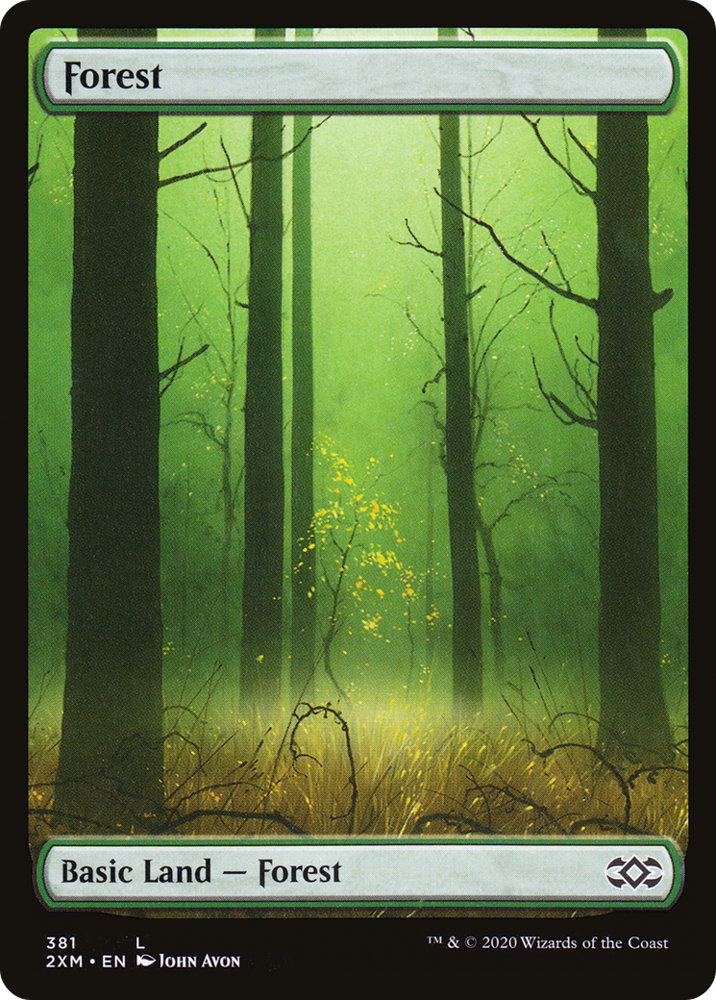

In [41]:
forest = list(data_dir.glob('Forest/*'))
PIL.Image.open(str(forest[0]))

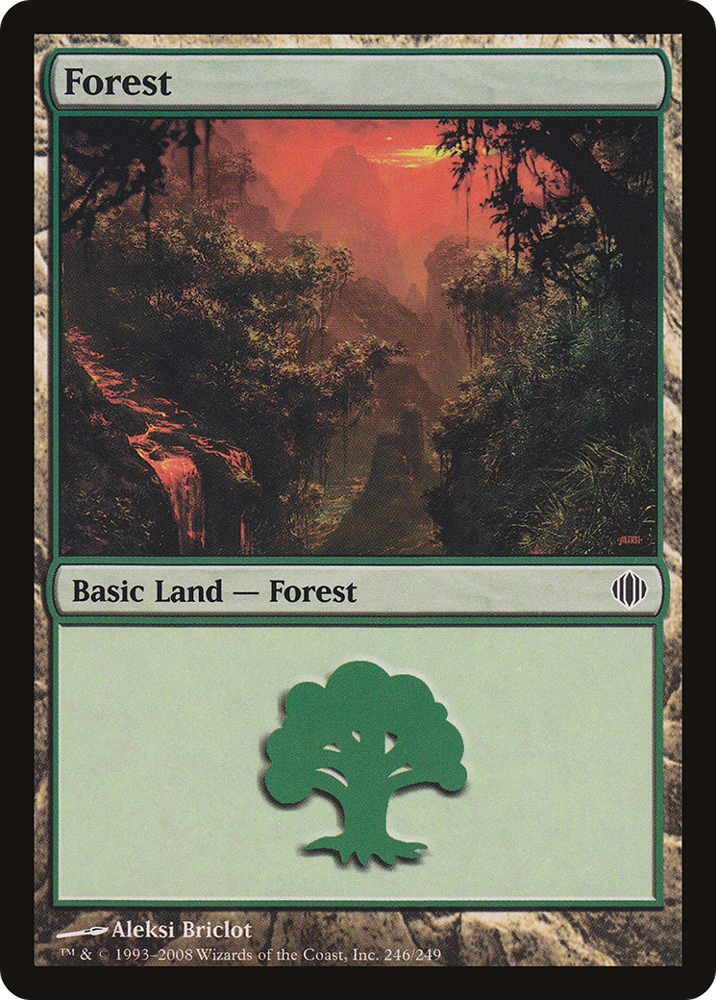

In [42]:
PIL.Image.open(str(forest[1]))

and some forks

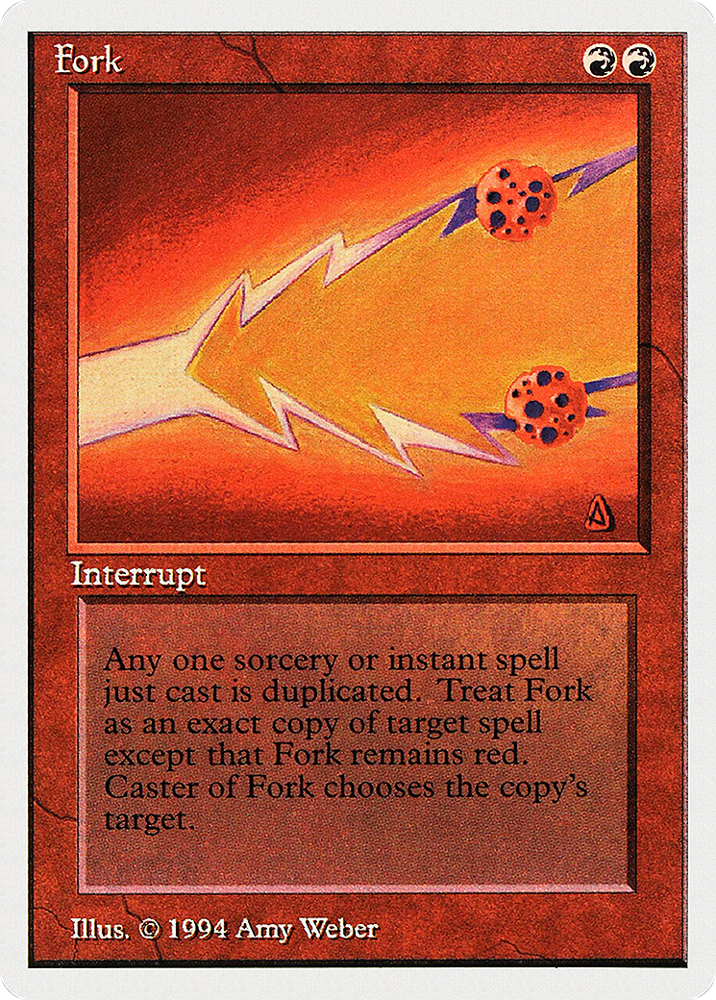

In [43]:
fork = list(data_dir.glob('Fork/*'))
PIL.Image.open(str(fork[0]))

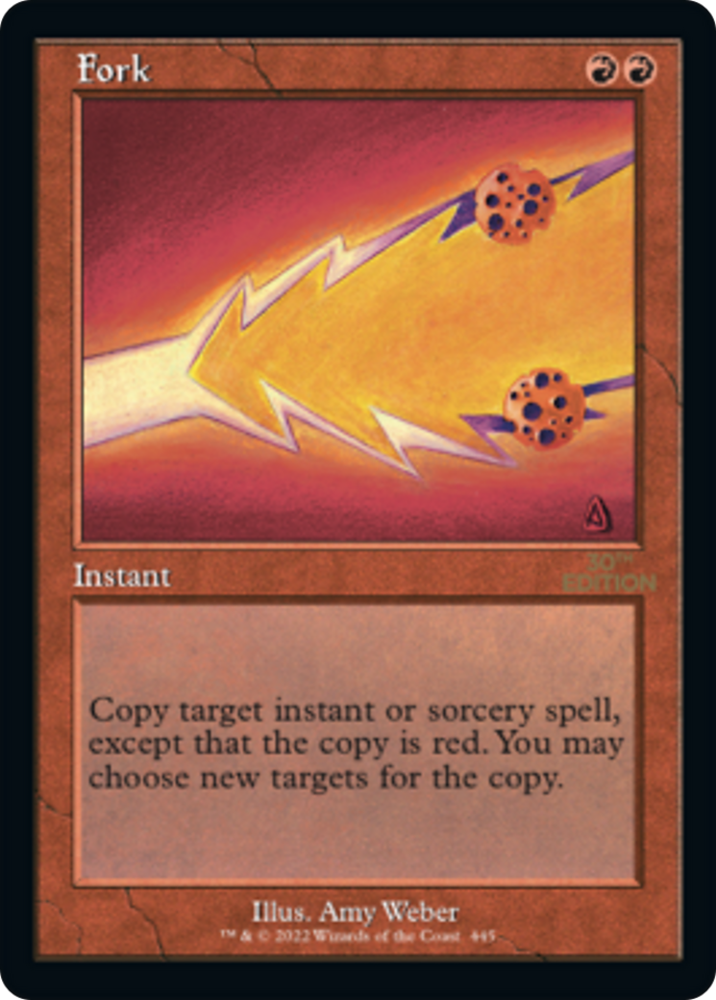

In [44]:
PIL.Image.open(str(fork[1]))

## Setup loader

In [45]:
batch_size = 32

img_width = 180
img_height = 251

In [46]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 10181 files belonging to 7558 classes.
Using 8145 files for training.


In [47]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 10181 files belonging to 7558 classes.
Using 2036 files for validation.


list of the class names from the dataset

In [48]:
class_names = train_ds.class_names
print(class_names)

['A-Akki Ronin', 'A-Ancestral Katana', 'A-Blessed Hippogriff  A-Tyrs Blessing', 'A-Circle of the Land Druid', 'A-Civil Servant', 'A-Dwarfhold Champion', 'A-Falcon Abomination', 'A-Futurist Operative', 'A-Haywire Mite', 'A-Kargan Warleader', 'A-Karn, Living Legacy', 'A-Masked Bandits', 'A-Nahiri, Heir of the Ancients', 'A-Ominous Parcel', 'A-Raiyuu, Storms Edge', 'A-Sunbathing Rootwalla', 'A-Teferi, Time Raveler', 'A-Tyvar Kell', 'A-Young Blue Dragon  A-Sand Augury', 'Abandon Reason', 'Abandon the Post', 'Abandoned Sarcophagus', 'Abbey Matron', 'Abeyance', 'Ability Punchcard', 'Aboleth Spawn', 'Abolish', 'Aboshans Desire', 'Abraded Bluffs', 'Abrupt Decay', 'Absorb Vis', 'Abu Jafar', 'Abundant Growth', 'Abundant Harvest', 'Abyssal Gatekeeper', 'Abyssal Horror', 'Abyssal Hunter', 'Abyssal Nightstalker', 'Abyssal Specter', 'Abzan Ascendancy', 'Abzan Beastmaster', 'Abzan Charm', 'Academic Probation', 'Academy Elite', 'Academy Manufactor', 'Access Denied', 'Acclaimed Contender', 'Accomplishe

## Visualize the data
the first nine images from the training dataset

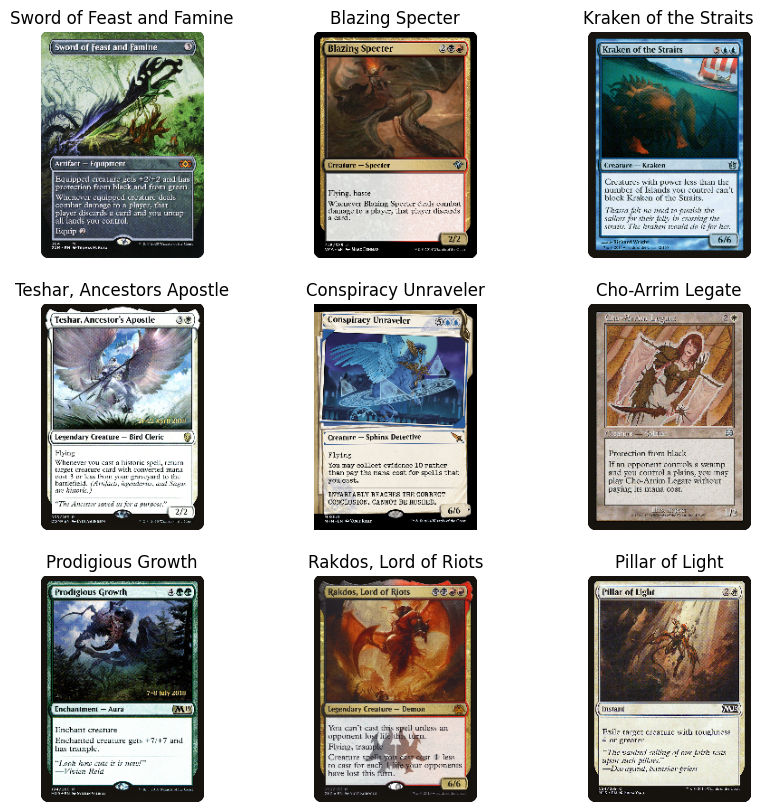

In [49]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [50]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 251, 180, 3)
(32,)


## Tune the data

In [51]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [52]:
normalization_layer = layers.Rescaling(1./255)

normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

2024-10-10 01:20:04.600000: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:71: Filling up shuffle buffer (this may take a while): 122 of 1000
2024-10-10 01:20:15.440795: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


0.0 0.99934876


In [53]:
num_classes = len(class_names)
num_classes

7558

## Data augmentation

In [54]:
data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal",
                      input_shape=(img_height,
                                  img_width,
                                  3)),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
  ]
)

/home/acid/code/tcicy/.mts/lib/python3.12/site-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Visualize a few augmented examples by applying data augmentation to the same image several times

2024-10-10 01:25:29.183055: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


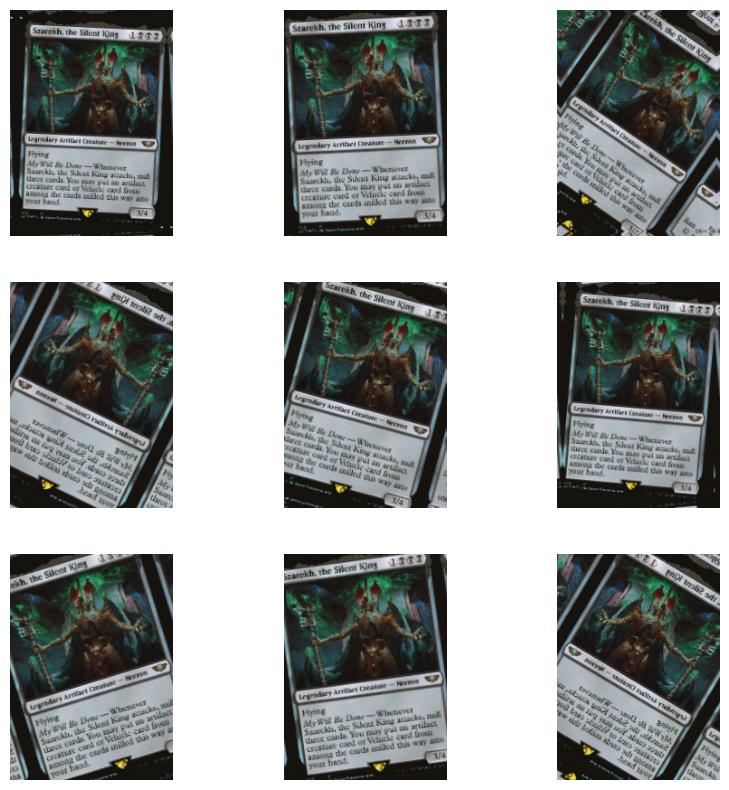

In [57]:
plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
  for i in range(9):
    augmented_images = data_augmentation(images)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[0].numpy().astype("uint8"))
    plt.axis("off")

## Compile and train the model

In [58]:
model = Sequential([
  data_augmentation,
  layers.Rescaling(1./255),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.2),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes, name="outputs")
])

In [59]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [60]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (None, 251, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_3 (Rescaling)         │ (None, 251, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 251, 180, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 125, 90, 16)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 125, 90, 32)    │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 45, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 62, 45, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 31, 22, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 31, 22, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 43648)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     5,587,072 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ outputs (Dense)                 │ (None, 7558)           │       974,982 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,585,638 (25.12 MB)

 Trainable params: 6,585,638 (25.12 MB)

 Non-trainable params: 0 (0.00 B)

In [61]:
epochs = 5
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/5


2024-10-10 01:26:16.242490: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/sequential_1_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2024-10-10 01:26:16.755033: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907
W0000 00:00:1728545176.814695   42472 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545176.846211   42472 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545176.847765   42472 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545176.853821   42472 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545176.857283   42472 gpu_timer.cc:114] Skipping the delay kernel, measurement ac

  3/255 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step - accuracy: 0.0000e+00 - loss: 8.9412

W0000 00:00:1728545177.564510   42472 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545177.572055   42472 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545177.578505   42472 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545177.584046   42472 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545177.590890   42472 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545177.599661   42472 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545177.608368   42472 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545177.612697   42472 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545177.618503   42472 gp

185/255 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.0056 - loss: 8.9335

W0000 00:00:1728545186.334024   42467 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545186.336201   42467 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545186.337234   42467 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545186.338406   42467 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545186.340391   42467 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545186.342140   42467 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545186.343464   42467 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545186.345035   42467 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545186.347166   42467 gp

186/255 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - accuracy: 0.0057 - loss: 8.9335

W0000 00:00:1728545186.536691   42467 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545186.538192   42467 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545186.539820   42467 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545186.542895   42467 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545186.545277   42467 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545186.548800   42467 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545186.553951   42467 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545186.560205   42467 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545186.564389   42467 gp

255/255 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.0065 - loss: 8.9354 - val_accuracy: 0.0138 - val_loss: 8.9718
Epoch 2/5


W0000 00:00:1728545195.462449   42469 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545195.463627   42469 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545195.464687   42469 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545195.466976   42469 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545195.469720   42469 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545195.471144   42469 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545195.472935   42469 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545195.476383   42469 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545195.478034   42469 gp

255/255 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step - accuracy: 0.0117 - loss: 8.7821 - val_accuracy: 0.0123 - val_loss: 9.1107
Epoch 3/5
255/255 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step - accuracy: 0.0160 - loss: 8.5589 - val_accuracy: 0.0157 - val_loss: 9.3917
Epoch 4/5
255/255 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step - accuracy: 0.0263 - loss: 8.2110 - val_accuracy: 0.0221 - val_loss: 10.1105
Epoch 5/5
255/255 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step - accuracy: 0.0297 - loss: 7.8394 - val_accuracy: 0.0250 - val_loss: 10.9862


## Visualize training results


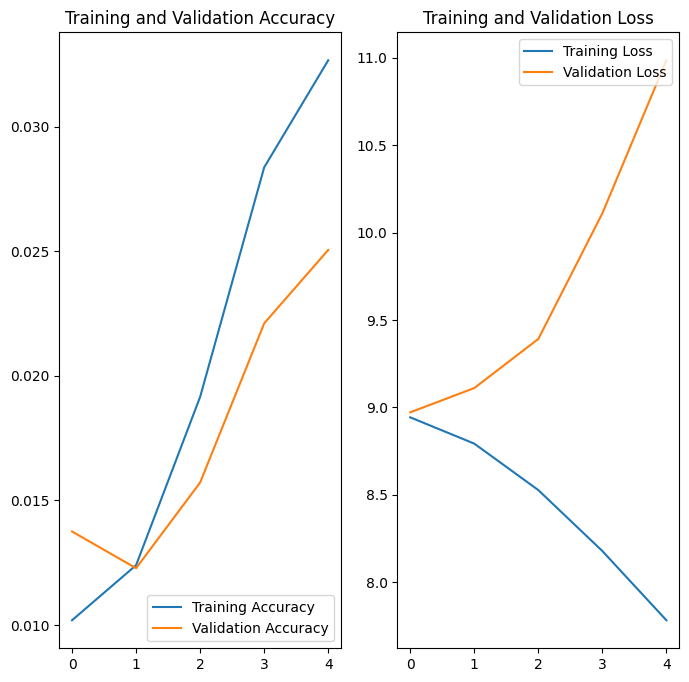

In [62]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

## Predict on new data

In [63]:
sunflower_url = "https://cards.scryfall.io/png/front/0/0/0000419b-0bba-4488-8f7a-6194544ce91e.png?1721427487"
sunflower_path = tf.keras.utils.get_file('Forest_280_Bloomburrow', origin=sunflower_url)

img = tf.keras.utils.load_img(
    sunflower_path, target_size=(img_height, img_width)
)
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])

print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score)], 100 * np.max(score))
)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
This image most likely belongs to Mountain with a 6.02 percent confidence.


W0000 00:00:1728545297.033561   42470 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545297.034344   42470 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545297.035653   42470 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545297.036750   42470 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545297.037459   42470 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545297.039438   42470 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545297.040072   42470 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545297.041150   42470 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1728545297.041998   42470 gp

## Convert model to a TensorFlow Lite model
To use the trained model with on-device applications, first [convert it](https://www.tensorflow.org/lite/models/convert) to a smaller and more efficient model format called a [TensorFlow Lite](https://www.tensorflow.org/lite/) model.

In [65]:
# Convert the model.
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the model.
with open('models/tcg_magic.tflite', 'wb') as f:
  f.write(tflite_model)

INFO:tensorflow:Assets written to: /tmp/tmp9itgy_p5/assets


INFO:tensorflow:Assets written to: /tmp/tmp9itgy_p5/assets


Saved artifact at '/tmp/tmp9itgy_p5'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 251, 180, 3), dtype=tf.float32, name='keras_tensor_4')
Output Type:
  TensorSpec(shape=(None, 7558), dtype=tf.float32, name=None)
Captures:
  137862717612176: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137862717604688: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137862883992080: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137862883993616: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137862692937104: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137862692940176: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137862692937296: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137862692938256: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137862692938064: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137862692937872: TensorSpec(shape=(), dtype=tf.resource, name=None)


W0000 00:00:1728545361.020958   40910 tf_tfl_flatbuffer_helpers.cc:392] Ignored output_format.
W0000 00:00:1728545361.020967   40910 tf_tfl_flatbuffer_helpers.cc:395] Ignored drop_control_dependency.
2024-10-10 01:29:21.021084: I tensorflow/cc/saved_model/reader.cc:83] Reading SavedModel from: /tmp/tmp9itgy_p5
2024-10-10 01:29:21.021732: I tensorflow/cc/saved_model/reader.cc:52] Reading meta graph with tags { serve }
2024-10-10 01:29:21.021742: I tensorflow/cc/saved_model/reader.cc:147] Reading SavedModel debug info (if present) from: /tmp/tmp9itgy_p5
2024-10-10 01:29:21.027453: I tensorflow/cc/saved_model/loader.cc:236] Restoring SavedModel bundle.
2024-10-10 01:29:21.083898: I tensorflow/cc/saved_model/loader.cc:220] Running initialization op on SavedModel bundle at path: /tmp/tmp9itgy_p5
2024-10-10 01:29:21.093484: I tensorflow/cc/saved_model/loader.cc:462] SavedModel load for tags { serve }; Status: success: OK. Took 72399 microseconds.


### Run the TensorFlow Lite model


Load the model with the `Interpreter`:

In [67]:
TF_MODEL_FILE_PATH = 'models/tcg_magic.tflite' # The default path to the saved TensorFlow Lite model

interpreter = tf.lite.Interpreter(model_path=TF_MODEL_FILE_PATH)

Print the signatures from the converted model to obtain the names of the inputs (and outputs)

In [68]:
interpreter.get_signature_list()

{'serving_default': {'inputs': ['keras_tensor_4'], 'outputs': ['output_0']}}

In [69]:
classify_lite = interpreter.get_signature_runner('serving_default')
classify_lite

In [70]:
# predictions_lite = classify_lite(keras_tensor_15=img_array)['outputs']
predictions_lite = classify_lite(keras_tensor_4=img_array)['output_0']
score_lite = tf.nn.softmax(predictions_lite)

In [71]:
print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score_lite)], 100 * np.max(score_lite))
)

This image most likely belongs to Mountain with a 6.02 percent confidence.


In [72]:
print(np.max(np.abs(predictions - predictions_lite)))

2.861023e-06
